# Лабораторная работа 4: Семантическая сегментация с использованием PyTorch

## Цели работы

Цель — разработать и обучить сверточную нейронную сеть для задачи мультиклассовой семантической сегментации изображений на наборе данных [SUIM](https://www.kaggle.com/datasets/ashish2001/semantic-segmentation-of-underwater-imagery-suim) с использованием PyTorch.

## Набор данных.

1. Данные содержат 8 классов. Маска сегментации имеет вид трехканального изображения с пикселями, значения которых равно либо 0, либо 255, например, (0, 0, 0), (0, 0, 255) и так далее. Помимо этого встречаются и промежуточные значения, отличные от 0 и 255. В рамках данной лабораторной работы предлагается следующее преобразование: значения маски, меньшие 128, нужно установить в 0, а значения, равные или больше 128, установить в 255.

2. Для упрощения работы рекомендуется объединить следующие классы в один:
- класс 2 - Aquatic plants and sea-grass
- класс 3 - Wrecks and ruins
- класс 5 - Reefs and invertebrates
- класс 7 - Sea-floor and rocks

##  Требования

1. Необходимо выполнить и отобразить в Jupyter следующие задачи:

	- Загрузка и проверка данных. Загрузить и предобработать данные с демонстрацией избранных изображений и соответствующих масок, чтобы подтвердить корректность загрузки и соответствие размерностей данных.
	- Реализация архитектуры сети. Разработать архитектуру нейронной сети для сегментации с использованием фреймворка PyTorch.
	- Настройка гиперпараметров обучения. Настроить параметры обучения, такие как функция ошибки, размер сети, скорость обучения и другие параметры.
	- Тестирование модели. После завершения обучения для оценки качества работы необходимо посчитать accuracy, [IoU](https://lightning.ai/docs/torchmetrics/latest/segmentation/mean_iou.html) и визуализировать [confusion matrix](https://scikit-learn.org/dev/modules/generated/sklearn.metrics.confusion_matrix.html) (с нормализацией, ```normalize='true'```).
	- Визуализация результатов. После завершения обучения построить и отобразить результаты сегментации на тестовых изображениях, сравнивая с реальными масками сегментации.

2. Выбор архитектуры:
  - Можно использовать или адаптировать известные архитектуры глубокого обучения.
  - Может быть полезным:
    - уменьшить количество параметров в нейронной сети и размер входного изображения для ускорения сходимости, предотвращения переобучения и ускорения работы нейронной сети.
    - использовать аугментацию данных и взвешенные/специализированные функции ошибки. При аугментации данных необходимо учитывать связь изображений с маской классов.
  - Использовать перенос знаний недопустимо.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import confusion_matrix
import seaborn as sea

import matplotlib.pyplot as plt
from torchsummary import summary
from PIL import Image
import numpy as np
import time

Загрузка и проверка корректности данных

In [ ]:
import os
import shutil

from google.colab import drive
drive.mount('/content/drive')

def copy_files_recursive(source_folder, destination_folder):
    for root, dirs, files in os.walk(source_folder):
        for file in files:
            source_path = os.path.join(root, file)
            destination_path = os.path.join(destination_folder, os.path.relpath(source_path, source_folder))

            os.makedirs(os.path.dirname(destination_path), exist_ok=True)

            shutil.copyfile(source_path, destination_path)

Mounted at /content/drive


In [ ]:
remote_root = '/content/drive/MyDrive/SUIM'
root = '/content/SUIM'
copy_files_recursive(remote_root, root)

In [ ]:
number_classes = 5

classes = {
    "background": [(0, 0, 0)],
    "human_divers": [(0, 0, 1)],
    "robots": [(1, 0, 0)],
    "fish_vertebrates": [(1, 1, 0)],
    "other": [(0, 1, 0), (0, 1, 1), (1, 0, 1), (1, 1, 1)]
}

color_classes = [[0, 0, 0],
                 [0, 0, 1],
                 [1, 0, 0],
                 [1, 1, 0],
                 [0, 1, 0]]

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, images, masks):
        self.images = torch.tensor(images, dtype = torch.float)
        self.masks = torch.tensor(masks, dtype = torch.float)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]
        return image, mask


def load_dataset(root_images, root_masks, image_size):
    images = []
    list_dir = sorted(os.listdir(root_images))
    for file_name in list_dir:
        file_path = os.path.join(root_images, file_name)
        if os.path.isfile(file_path):
            with Image.open(file_path) as image:
                resized_image = np.array(image.resize(image_size)) / 255
                images.append(resized_image)

    labels = []
    list_dir = sorted(os.listdir(root_masks))
    for file_name in list_dir:
        file_path = os.path.join(root_masks, file_name)
        if os.path.isfile(file_path):
            with Image.open(file_path) as mask:
                background = np.zeros(image_size)
                human_divers = np.zeros(image_size)
                robots = np.zeros(image_size)
                fish_vertebrates = np.zeros(image_size)
                other = np.zeros(image_size)

                resized_mask = np.array(mask.resize(image_size)) / 255
                resized_mask = np.where(resized_mask < 0.5, 0, 1)

                for i in range(image_size[0]):
                    for j in range(image_size[1]):
                        if np.all(resized_mask[i, j] == classes["background"], axis = -1):
                            background[i, j] = 1
                        elif np.all(resized_mask[i, j] == classes["human_divers"], axis = -1):
                            human_divers[i, j] = 1
                        elif np.all(resized_mask[i, j] == classes["robots"], axis = -1):
                            robots[i, j] = 1
                        elif np.all(resized_mask[i, j] == classes["fish_vertebrates"], axis = -1):
                            fish_vertebrates[i, j] = 1
                        else:
                            other[i, j] = 1

                labels.append(np.stack([background, human_divers, robots, fish_vertebrates, other], -1))

    images = np.array(images)
    labels = np.array(labels)
    dataset = CustomDataset(images, labels)

    return dataset

In [ ]:
def dataset_info(dataset):
    print("Размер датасета изображений:", dataset.images.shape)
    print("Размер датасета масок:", dataset.masks.shape)
    print()

    number_pixels = {'Background': np.count_nonzero(dataset.masks[:, :, :, 0] == 1),
                     'Human divers': np.count_nonzero(dataset.masks[:, :, :, 1] == 1),
                     'Robots': np.count_nonzero(dataset.masks[:, :, :, 2] == 1),
                     'Fish and vertebrates': np.count_nonzero(dataset.masks[:, :, :, 3] == 1),
                     'Other': np.count_nonzero(dataset.masks[:, :, :, 4] == 1)}

    sum_pixel = dataset.images.shape[0] * dataset.images.shape[1] * dataset.images.shape[2]

    for key, value in number_pixels.items():
        print(f'Класс: {key}, Число пикселей: {value}({(value / sum_pixel * 100):.2f}%)')

In [ ]:
image_size = 80

In [ ]:
root_train_images = "/content/SUIM/train_val/images"
root_train_masks = "/content/SUIM/train_val/masks"
train_dataset = load_dataset(root_train_images, root_train_masks, (image_size, image_size))

In [ ]:
root_test_images = "/content/SUIM/TEST/images"
root_test_masks = "/content/SUIM/TEST/masks"
test_dataset = load_dataset(root_test_images, root_test_masks, (image_size, image_size))

In [ ]:
print('Train dataset:')
dataset_info(train_dataset)
print()
print('Test dataset:')
dataset_info(test_dataset)

Train dataset:
Размер датасета изображений: torch.Size([1525, 80, 80, 3])
Размер датасета масок: torch.Size([1525, 80, 80, 5])

Класс: Background, Число пикселей: 3034338(31.09%)
Класс: Human divers, Число пикселей: 184114(1.89%)
Класс: Robots, Число пикселей: 37740(0.39%)
Класс: Fish and vertebrates, Число пикселей: 767257(7.86%)
Класс: Other, Число пикселей: 5736551(58.78%)

Test dataset:
Размер датасета изображений: torch.Size([110, 80, 80, 3])
Размер датасета масок: torch.Size([110, 80, 80, 5])

Класс: Background, Число пикселей: 282598(40.14%)
Класс: Human divers, Число пикселей: 20661(2.93%)
Класс: Robots, Число пикселей: 4557(0.65%)
Класс: Fish and vertebrates, Число пикселей: 54083(7.68%)
Класс: Other, Число пикселей: 342101(48.59%)


In [ ]:
def plot_images_with_masks(dataset, title):
    vert_size = 6
    horiz_size = 3
    fig, axes = plt.subplots(vert_size, horiz_size * 2, figsize = (15, 15))
    fig.suptitle(title)

    mask_sizes = (image_size, image_size, 3)

    count_images = vert_size * horiz_size
    for number in range(count_images):
        i = number // horiz_size
        j = number % horiz_size

        image, mask = dataset[number]

        axes[i, j * 2].imshow(image, cmap=plt.cm.binary)
        axes[i, j * 2].axis('off')

        rgb_mask = np.zeros(mask_sizes)
        for k in range(number_classes):
            rgb_mask[mask[:, :, k] > 0] = color_classes[k]

        axes[i, j * 2 + 1].imshow(image, cmap=plt.cm.binary)
        axes[i, j * 2 + 1].imshow(rgb_mask, alpha = 0.35)
        axes[i, j * 2 + 1].axis('off')

    plt.tight_layout()
    plt.show()

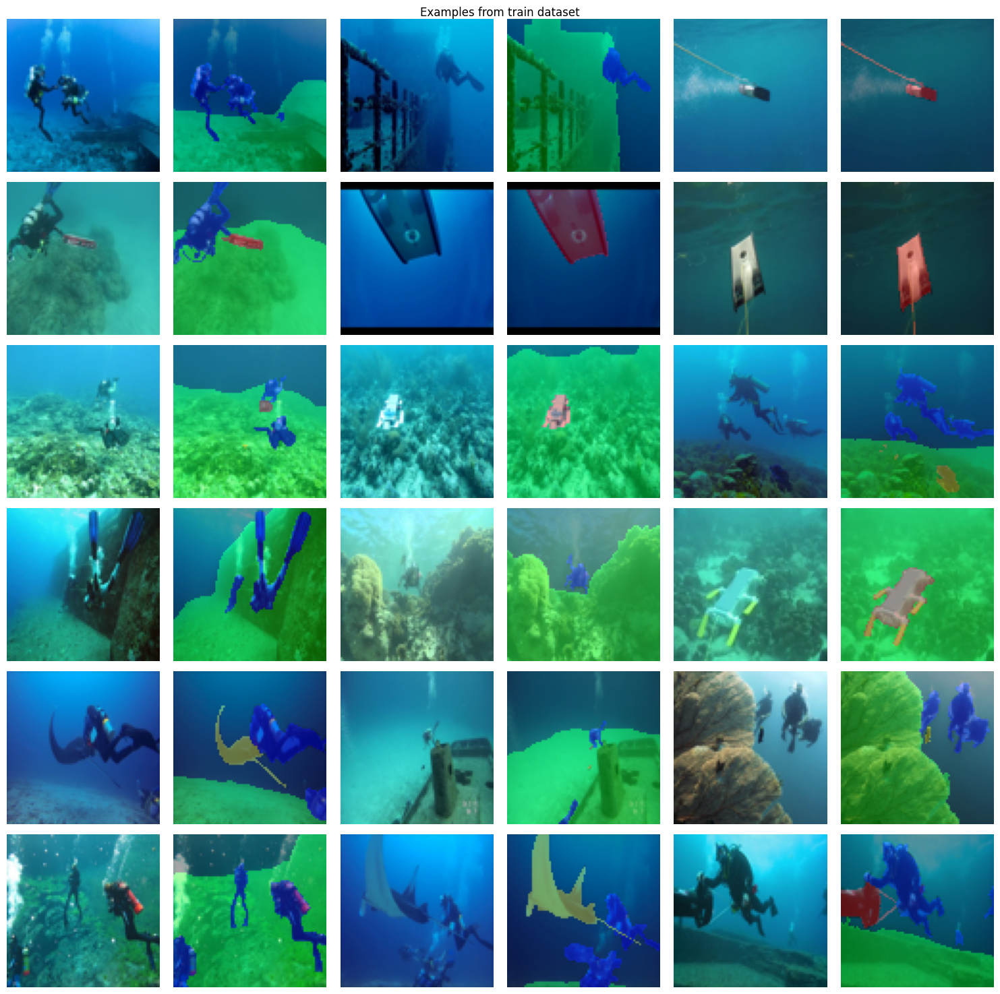

In [ ]:
plot_images_with_masks(train_dataset, 'Examples from train dataset')

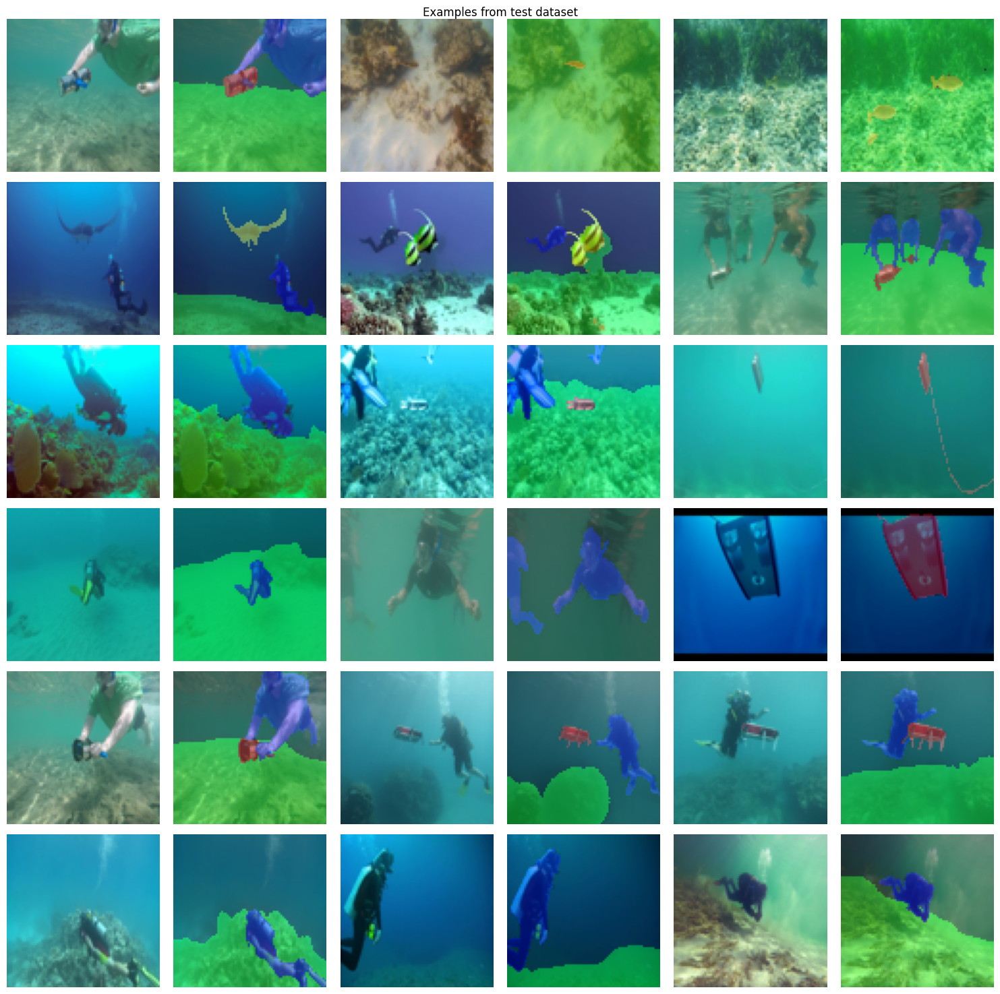

In [ ]:
plot_images_with_masks(test_dataset, 'Examples from test dataset')

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Device: {device}')

Device: cuda


#### Эксперименты

Гиперпараметры обучения

In [ ]:
learning_rate = 0.01
epochs = 50
batch_size = 36

Разбиение датасетов на батчи

In [ ]:
training_dataset, validation_dataset = torch.utils.data.random_split(train_dataset, [0.85, 0.15])
training_loader = DataLoader(training_dataset, batch_size = batch_size, shuffle = True)
validation_loader = DataLoader(validation_dataset, batch_size = batch_size, shuffle = True)
test_loader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False)

In [ ]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size = 3, padding = 'same'),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Dropout(0.25)
        )

    def forward(self, x):
        return self.double_conv(x)


class DownSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.max_pool = nn.MaxPool2d(kernel_size = 2, stride = 2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x):
        x = self.max_pool(x)
        return self.conv(x)


class UpSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.Upsample(scale_factor = 2, mode = 'bilinear', align_corners = True)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim = 1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size = 1)

    def forward(self, x):
        return self.conv(x)


class UNet(nn.Module):
    def __init__(self, n_channels = 3, n_classes = 5):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes

        self.input = DoubleConv(n_channels, 64)
        self.down1 = DownSample(64, 128)
        self.down2 = DownSample(128, 256)
        self.down3 = DownSample(256, 512)
        self.down4 = DownSample(512, 1024)

        self.up1 = UpSample(1024 + 512, 512)
        self.up2 = UpSample(512 + 256, 256)
        self.up3 = UpSample(256 + 128, 128)
        self.up4 = UpSample(128 + 64, 64)

        self.output = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.input(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)

        logits = self.output(x)
        return torch.sigmoid(logits)

In [ ]:
net = UNet().to(device)
criterion = nn.BCELoss()
optimizer = optim.Adam(net.parameters(), lr = learning_rate)
summary(net, (3, image_size, image_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 80, 80]           1,792
       BatchNorm2d-2           [-1, 64, 80, 80]             128
              ReLU-3           [-1, 64, 80, 80]               0
           Dropout-4           [-1, 64, 80, 80]               0
        DoubleConv-5           [-1, 64, 80, 80]               0
         MaxPool2d-6           [-1, 64, 40, 40]               0
            Conv2d-7          [-1, 128, 40, 40]          73,856
       BatchNorm2d-8          [-1, 128, 40, 40]             256
              ReLU-9          [-1, 128, 40, 40]               0
          Dropout-10          [-1, 128, 40, 40]               0
       DoubleConv-11          [-1, 128, 40, 40]               0
       DownSample-12          [-1, 128, 40, 40]               0
        MaxPool2d-13          [-1, 128, 20, 20]               0
           Conv2d-14          [-1, 256,

In [ ]:
def train(net, train_loader, validation_loader, criterion, epochs):
  for epoch in range(epochs):
      loss_list = []
      time_one = time.time()
      for data in train_loader:
          images = data[0].permute(0, 3, 1, 2).to(device)
          labels = data[1].permute(0, 3, 1, 2).to(device)

          outputs = net(images)
          loss = criterion(outputs, labels)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          loss_list.append(loss)
      diff_time = time.time() - time_one

      loss_validation_list = []
      time_one = time.time()
      for data in validation_loader:
          images = data[0].permute(0, 3, 1, 2).to(device)
          labels = data[1].permute(0, 3, 1, 2).to(device)

          outputs = net(images)
          loss = criterion(outputs, labels)

          loss_validation_list.append(loss)
      diff_time_validation = time.time() - time_one

      print(f"Epoch: {epoch + 1}/{epochs}, Train "
            f"Loss: {torch.stack(loss_list).mean():.4f}, "
            f"Time: {diff_time:.2f} Validation "
            f"Loss: {torch.stack(loss_validation_list).mean():.4f}, "
            f"Time: {diff_time_validation:.2f}")

In [ ]:
train(net, training_loader, validation_loader, criterion, epochs)

Epoch: 1/50, Train Loss: 0.3104, Time: 6.52 Validation Loss: 0.2474, Time: 0.44
Epoch: 2/50, Train Loss: 0.2360, Time: 6.46 Validation Loss: 0.2362, Time: 0.44
Epoch: 3/50, Train Loss: 0.2245, Time: 6.49 Validation Loss: 0.2295, Time: 0.45
Epoch: 4/50, Train Loss: 0.2223, Time: 6.53 Validation Loss: 0.2209, Time: 0.45
Epoch: 5/50, Train Loss: 0.2197, Time: 6.56 Validation Loss: 0.2144, Time: 0.45
Epoch: 6/50, Train Loss: 0.2108, Time: 6.57 Validation Loss: 0.2093, Time: 0.45
Epoch: 7/50, Train Loss: 0.2107, Time: 6.57 Validation Loss: 0.2316, Time: 0.45
Epoch: 8/50, Train Loss: 0.2240, Time: 6.60 Validation Loss: 0.2081, Time: 0.45
Epoch: 9/50, Train Loss: 0.2034, Time: 6.63 Validation Loss: 0.2433, Time: 0.46
Epoch: 10/50, Train Loss: 0.2316, Time: 6.65 Validation Loss: 0.2114, Time: 0.46
Epoch: 11/50, Train Loss: 0.2001, Time: 6.66 Validation Loss: 0.2070, Time: 0.46
Epoch: 12/50, Train Loss: 0.1955, Time: 6.69 Validation Loss: 0.1991, Time: 0.46
Epoch: 13/50, Train Loss: 0.1875, Tim

In [ ]:
def IoU(labels, predict):
    intersection = np.logical_and(labels, predict)
    union = np.logical_or(labels, predict)
    if np.sum(union) == 0:
        iou_score = 0
    else:
        iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

def metrics_compute(net, data_loader):
    accuracy_list, IoU_list = [], []
    cm_mask, cm_predict_mask = [], []

    with torch.no_grad():
        for images, masks in data_loader:
            images = images.permute(0, 3, 1, 2).to(device)
            masks = masks.permute(0, 3, 1, 2).numpy()

            predict_masks = net(images)
            predict_masks = torch.where(predict_masks < torch.tensor(0.5), torch.tensor(0), torch.tensor(1)).cpu().numpy()

            for k in range(5):
                masks_tmp = masks[:, k, :, :]
                predict_masks_tmp = predict_masks[:, k, :, :]

                masks_tmp = np.where(masks_tmp != 1, 0, k + 1)
                predict_masks_tmp = np.where(predict_masks_tmp != 1, 0, k + 1)
                masks[:, k, :, :] = masks_tmp
                predict_masks[:, k, :, :] = predict_masks_tmp

            cm_mask.append(masks)
            cm_predict_mask.append(predict_masks)

            temp_accucary, temp_iou = [], []
            for k in range(5):
                accuracy = np.mean(predict_masks[:, k, :, :] == masks[:, k, :, :])
                iou = IoU(masks[:, k, :, :], predict_masks[:, k, :, :])
                temp_accucary.append(accuracy)
                temp_iou.append(iou)

            accuracy_list.append(temp_accucary)
            IoU_list.append(temp_iou)

    accuracy_list = np.array(accuracy_list)
    IoU_list = np.array(IoU_list)

    print(f'Оценка Accuracy для каждого класса: {np.mean(accuracy_list, axis = 0, dtype = np.float16)}')
    print(f'Оценка IoU для каждого класса: {np.mean(IoU_list, axis = 0, dtype = np.float16)}')

    print(f'Оценка Accuracy на данных: {np.mean(accuracy_list, dtype = np.float16):.4f}')
    print(f'Оценка IoU на данных: {np.mean(IoU_list, dtype = np.float16):.4f}')

    cm_mask = np.concatenate(cm_mask, axis = 0)
    cm_predict_mask = np.concatenate(cm_predict_mask, axis = 0)
    cm_mask = cm_mask.flatten()
    cm_predict_mask = cm_predict_mask.flatten()

    name_class = ['Background', 'Human divers', 'Robots', 'Fish and vertebrates', 'Other']
    cm = confusion_matrix(cm_mask, cm_predict_mask, labels = np.arange(5), normalize = 'true')
    sea.heatmap(cm, annot = True, cmap = 'Blues', xticklabels = name_class, yticklabels = name_class)
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title('Confusion matrix')
    plt.show()

Оценка Accuracy для каждого класса: [0.911  0.979  0.995  0.9478 0.875 ]
Оценка IoU для каждого класса: [0.792  0.1936 0.0718 0.2764 0.786 ]
Оценка Accuracy на данных: 0.9414
Оценка IoU на данных: 0.4243


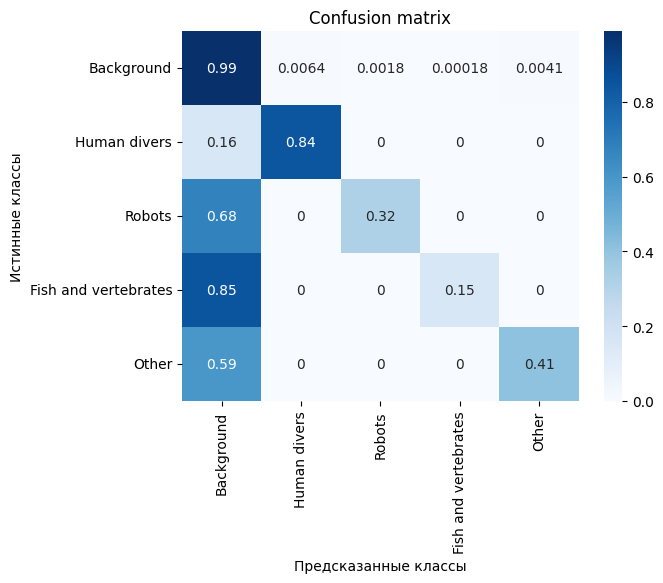

In [91]:
metrics_compute(net, test_loader)

In [96]:
def plot_images_with_masks_test(net, dataset):
    vert_size = 12
    horiz_size = 2
    fig, axes = plt.subplots(vert_size, horiz_size * 3, figsize = (15, 25))
    fig.suptitle("Predicted vs. True")

    mask_sizes = (image_size, image_size, 3)

    count_images = vert_size * horiz_size
    for number in range(count_images):
        i = number // horiz_size
        j = number % horiz_size

        image, mask = dataset[number]

        axes[i, j * 3].imshow(image, cmap=plt.cm.binary)
        axes[i, j * 3].set_title('Image', fontsize = 10)
        axes[i, j * 3].axis('off')

        with torch.no_grad():
            images = image
            images = images.unsqueeze(0)
            images = images.permute(0, 3, 1, 2).to(device)
            predict_mask = net(images)
            predict_mask = torch.where(predict_mask < torch.tensor(0.5), torch.tensor(0), torch.tensor(1)).permute(0, 2, 3, 1).cpu()

        rgb_predicted_mask = np.zeros(mask_sizes)
        for k in range(number_classes):
            rgb_predicted_mask[predict_mask[0, :, :, k] > 0] = color_classes[k]

        axes[i, j * 3 + 1].imshow(image, cmap=plt.cm.binary)
        axes[i, j * 3 + 1].imshow(rgb_predicted_mask, alpha = 0.35)
        axes[i, j * 3 + 1].set_title('Predicted', fontsize = 10)
        axes[i, j * 3 + 1].axis('off')

        rgb_mask = np.zeros(mask_sizes)
        for k in range(number_classes):
            rgb_mask[mask[:, :, k] > 0] = color_classes[k]

        axes[i, j * 3 + 2].imshow(image, cmap=plt.cm.binary)
        axes[i, j * 3 + 2].imshow(rgb_mask, alpha = 0.35)
        axes[i, j * 3 + 2].set_title('True', fontsize = 10)
        axes[i, j * 3 + 2].axis('off')

    plt.tight_layout()
    plt.show()

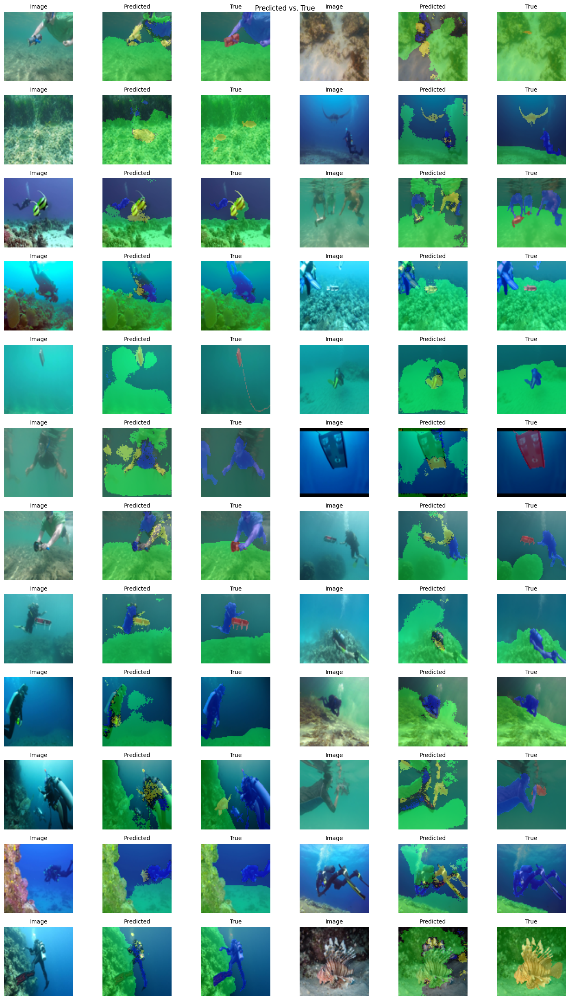

In [97]:
plot_images_with_masks_test(net, test_dataset)

Аугментация данных и перебалансировка классов

В тренировочных данных у нас большой перекос данных в сторону классов "Background" и "Other". Попробуем использовать аугментацию для увеличения количества пикселей маленьких классов и уберем картинки, на которых большая часть это "Background" и "Other"

In [82]:
def data_rebalancing(dataset, coeff):
    new_images = []
    new_masks = []

    mask_sizes = (image_size, image_size, 3)

    count_pixels = image_size * image_size

    for image, mask in dataset:
        rgb_mask = np.zeros(mask_sizes)
        for k in range(number_classes):
            rgb_mask[mask[:, :, k] > 0] = color_classes[k]

        count_colors = [0, 0, 0, 0, 0]
        for i in range(image_size):
            for j in range(image_size):
                for k in range(number_classes):
                    if np.all(rgb_mask[i, j] == color_classes[k], axis=-1):
                        count_colors[k] += 1

        back_other_colors = count_colors[0] + count_colors[4]
        small_classes_colors = count_pixels - back_other_colors

        if back_other_colors / count_pixels < 1 - coeff:
            print('Количество пикселей на класс: ', count_colors)

            new_images.append(image)
            new_masks.append(mask)

            down_image = np.flipud(image)
            down_mask = np.flipud(mask)
            new_images.append(down_image)
            new_masks.append(down_mask)

            right_image = np.fliplr(image)
            right_mask = np.fliplr(mask)
            new_images.append(right_image)
            new_masks.append(right_mask)

            right_down_image = np.flipud(right_image)
            right_down_mask = np.flipud(right_mask)
            new_images.append(right_down_image)
            new_masks.append(right_down_mask)

    new_images = np.array(new_images)
    new_masks = np.array(new_masks)

    new_dataset = CustomDataset(new_images, new_masks)
    return new_dataset

In [83]:
new_train_dataset = data_rebalancing(train_dataset, 0.2)

Количество пикселей на класс:  [4856, 690, 0, 764, 90]
Количество пикселей на класс:  [1290, 1321, 1371, 0, 2418]
Количество пикселей на класс:  [4886, 463, 1051, 0, 0]
Количество пикселей на класс:  [1576, 1815, 385, 0, 2624]
Количество пикселей на класс:  [1451, 146, 0, 1502, 3301]
Количество пикселей на класс:  [2011, 1674, 0, 1769, 946]
Количество пикселей на класс:  [4962, 1081, 357, 0, 0]
Количество пикселей на класс:  [5011, 403, 986, 0, 0]
Количество пикселей на класс:  [1295, 1459, 0, 2067, 1579]
Количество пикселей на класс:  [1543, 2165, 0, 0, 2692]
Количество пикселей на класс:  [4010, 0, 2390, 0, 0]
Количество пикселей на класс:  [2047, 1172, 127, 0, 3054]
Количество пикселей на класс:  [5016, 1384, 0, 0, 0]
Количество пикселей на класс:  [2446, 1694, 0, 0, 2260]
Количество пикселей на класс:  [4698, 1577, 124, 0, 1]
Количество пикселей на класс:  [1394, 1352, 0, 2578, 1076]
Количество пикселей на класс:  [2520, 1493, 0, 0, 2387]
Количество пикселей на класс:  [2620, 2186,

In [84]:
print('New train dataset:')
dataset_info(new_train_dataset)

New train dataset:
Размер датасета изображений: torch.Size([956, 80, 80, 3])
Размер датасета масок: torch.Size([956, 80, 80, 5])

Класс: Background, Число пикселей: 1762760(28.81%)
Класс: Human divers, Число пикселей: 250992(4.10%)
Класс: Robots, Число пикселей: 51116(0.84%)
Класс: Fish and vertebrates, Число пикселей: 1698740(27.76%)
Класс: Other, Число пикселей: 2354792(38.49%)


Настройка гиперпараметров

In [85]:
learning_rate = 0.01
epochs = 50
batch_size = 36

In [86]:
new_training_dataset, new_validation_dataset = torch.utils.data.random_split(new_train_dataset, [0.85, 0.15])
new_training_loader = DataLoader(new_training_dataset, batch_size = batch_size, shuffle = True)
new_validation_loader = DataLoader(new_validation_dataset, batch_size = batch_size, shuffle = True)

In [87]:
new_net = UNet().to(device)
criterion = nn.BCELoss()
optimizer = optim.Adam(new_net.parameters(), lr = learning_rate)

In [88]:
train(new_net, new_training_loader, new_validation_loader, criterion, epochs)

Epoch: 1/50, Train Loss: 0.4051, Time: 3.98 Validation Loss: 0.3252, Time: 0.31
Epoch: 2/50, Train Loss: 0.3262, Time: 3.91 Validation Loss: 0.3164, Time: 0.32
Epoch: 3/50, Train Loss: 0.3095, Time: 3.92 Validation Loss: 0.3135, Time: 0.32
Epoch: 4/50, Train Loss: 0.2874, Time: 3.93 Validation Loss: 0.2976, Time: 0.32
Epoch: 5/50, Train Loss: 0.2923, Time: 3.94 Validation Loss: 0.2854, Time: 0.32
Epoch: 6/50, Train Loss: 0.2801, Time: 3.95 Validation Loss: 0.2828, Time: 0.31
Epoch: 7/50, Train Loss: 0.2661, Time: 3.96 Validation Loss: 0.2777, Time: 0.32
Epoch: 8/50, Train Loss: 0.2621, Time: 3.96 Validation Loss: 0.2631, Time: 0.32
Epoch: 9/50, Train Loss: 0.2582, Time: 3.98 Validation Loss: 0.2560, Time: 0.32
Epoch: 10/50, Train Loss: 0.2515, Time: 3.99 Validation Loss: 0.2709, Time: 0.32
Epoch: 11/50, Train Loss: 0.2450, Time: 3.99 Validation Loss: 0.2595, Time: 0.32
Epoch: 12/50, Train Loss: 0.2384, Time: 4.01 Validation Loss: 0.2493, Time: 0.33
Epoch: 13/50, Train Loss: 0.2275, Tim

Оценка Accuracy для каждого класса: [0.8496 0.9673 0.9946 0.7993 0.7217]
Оценка IoU для каждого класса: [0.6587  0.1621  0.11926 0.1731  0.5244 ]
Оценка Accuracy на данных: 0.8662
Оценка IoU на данных: 0.3276


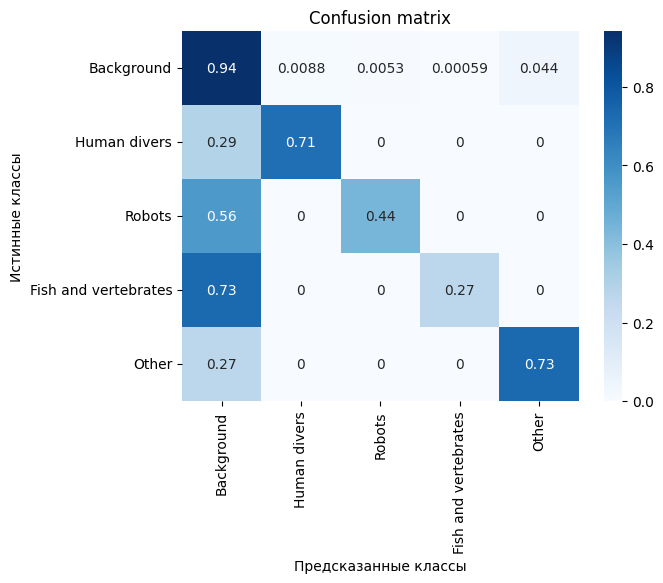

In [95]:
metrics_compute(new_net, test_loader)

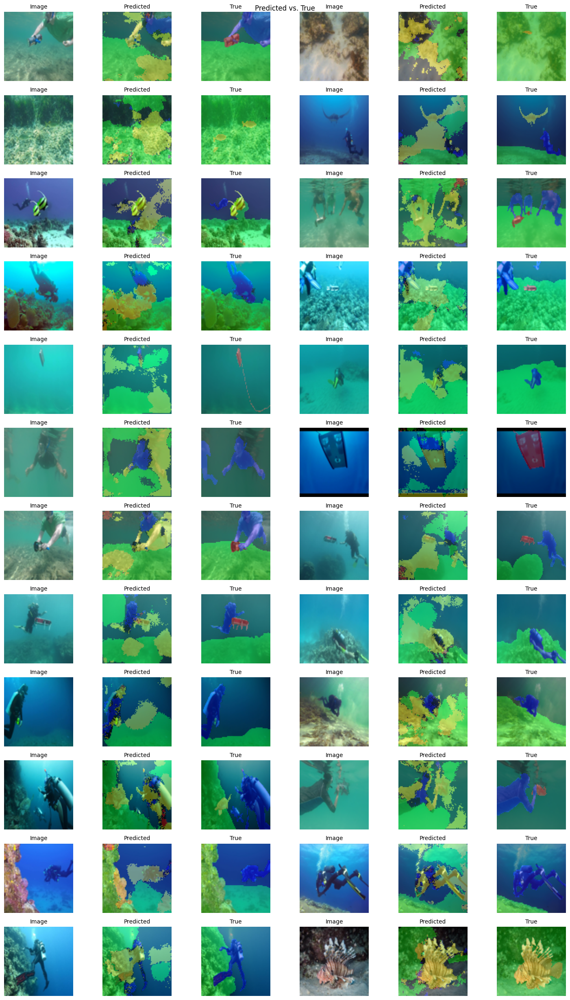

In [98]:
plot_images_with_masks_test(new_net, test_dataset)